# Comprehensive Guide to Image Filtering Using Convolution in OpenCV

This notebook provides an in-depth exploration of image filtering techniques using convolution in OpenCV. It is inspired by and expands upon the concepts from the website: https://learnopencv.com/image-filtering-using-convolution-in-opencv/#intro-convo-kernels.

We cover fundamental to advanced topics, including theoretical explanations, mathematical foundations, practical implementations, and real-world applications. Each section includes detailed documentation, code examples, and visual comparisons.

**Prerequisites:**
- Install required libraries: `pip install opencv-python matplotlib numpy`.
- Replace 'testImage.jpg' with your own image path if needed.
- This notebook uses Matplotlib for displaying images in subplots for side-by-side comparisons.

**Note:** All code cells assume the image is loaded in BGR format (OpenCV default). For grayscale operations, conversions are handled where necessary.

## Table of Contents
1. Introduction to Convolution in Image Processing
2. Mathematical Foundations of Convolution
3. Kernel Design Principles
4. Border Handling and Padding in Convolution
5. Applying Identity Kernel
6. Low-Pass Filters: Blurring Techniques
   - Custom Box Blur
   - Built-in Box Blur
   - Gaussian Blur
   - Median Blur
   - Bilateral Filter
7. High-Pass Filters: Sharpening and Edge Enhancement
   - Basic Sharpening Kernel
   - Unsharp Masking
   - Laplacian Filter for Edge Detection
   - Sobel Operators
8. Directional and Advanced Kernels
   - Emboss Filter
   - Prewitt Operator
   - Scharr Operator
   - Gabor Filters
9. Frequency Domain Filtering
   - Fourier Transform Basics
   - High-Pass and Low-Pass in Frequency Domain
10. Noise in Images: Addition and Removal
11. Performance Considerations and Optimization
12. Real-World Applications and Case Studies
13. Summary and Best Practices

## 1. Introduction to Convolution in Image Processing

Convolution is a fundamental operation in image processing where a kernel (small matrix) slides over the image, performing element-wise multiplication and summation to produce a filtered output.

Key applications:
- **Blurring (Low-Pass Filtering):** Reduces high-frequency components like noise or details.
- **Sharpening (High-Pass Filtering):** Enhances edges and fine details.
- **Edge Detection:** Identifies boundaries in images.
- **Feature Extraction:** Used in CNNs for machine learning.

In OpenCV, `cv2.filter2D()` is the core function for custom convolution.

## 2. Mathematical Foundations of Convolution

### Discrete 2D Convolution

For a 2D image $I$ and a kernel $K$ of size $(2m+1) \times (2n+1)$, the convolution at pixel $(x, y)$ is defined as:
$$
(I * K)(x, y)
=
\sum_{i=-m}^{m}
\sum_{j=-n}^{n}
I(x+i, y+j)\, K(m-i, n-j)
$$
### Key Concepts
- **1D vs 2D Convolution :** 1D convolution is used for signals (audio, time-series), while 2D convolution is used for images.  
  *Separable kernels* (e.g., Gaussian) can be decomposed into two 1D convolutions for efficiency.
- **Normalization :** Kernels are often normalized by dividing each element by the sum of all kernel values to preserve intensity.
- **Cross-Correlation vs Convolution :** OpenCV’s `filter2D()` applies **cross-correlation** (kernel is not flipped).
- **symmetric kernels :** convolution and cross-correlation are mathematically equivalent.


## 3. Kernel Design Principles

- **Size:** Odd dimensions (e.g., 3x3, 5x5) center easily.
- **Symmetry:** Often symmetric for isotropic effects.
- **Sum:** For low-pass, sum=1 (normalized); for high-pass, sum=0 or 1.
- **Examples:**
  - Identity: No change.
  - Box: Uniform averaging.
  - Gaussian: Weighted averaging based on distance.

## 4. Border Handling and Padding in Convolution

When the kernel overlaps image edges, padding is needed. OpenCV's `borderType` in `filter2D()`:
- `cv2.BORDER_CONSTANT`: Pad with constant value.
- `cv2.BORDER_REPLICATE`: Repeat edge pixels.
- `cv2.BORDER_REFLECT`: Mirror reflection.
- `cv2.BORDER_WRAP`: Wrap around.
- Default: `cv2.BORDER_DEFAULT` (reflect with no edge pixel flip).

Example: Padding affects edge artifacts in filtering.

In [46]:
# Import all dependencies
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from tools.tools import LearnTools

learn_tools = LearnTools()

Image Exists


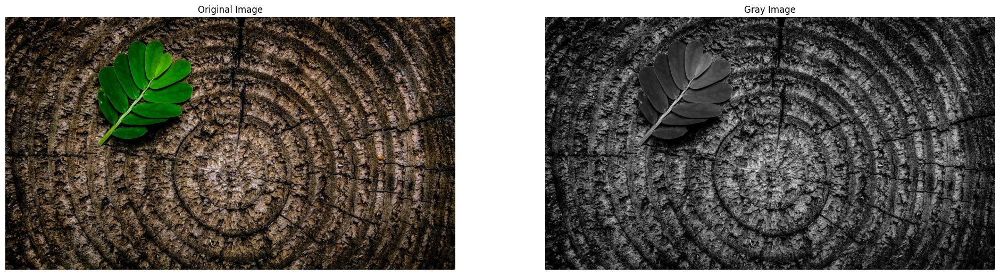

In [47]:
# Find and Load the image

if os.path.exists('testImage.jpg'):
    image = cv2.imread('testImage.jpg')
    print('Image Exists')
elif not os.path.exists('testImage.jpg'):
    image_url = "https://i.ibb.co.com/BVSYcmyY/joey-kyber-GPxgi4-J82-E4-unsplash.jpg"
    pil_image = await learn_tools.get_image(img_url=image_url, padding=0)
    pil_image.save('testImage.jpg', 'JPEG')
    # or
    image = learn_tools.pil_to_cv2(pil_image=pil_image)
    # cv2.imwrite('testImage.jpg', image)
    print('Image Created')

if image is not None:
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    learn_tools.show_two_images(title1='Original Image', img1=image, title2='Gray Image', img2=gray_image)
else:
    print('The image could not be loaded.')

## 5. Applying Identity Kernel
The identity kernel preserves the original image:
$$
K =
\begin{bmatrix}
0 & 0 & 0 \\
0 & 1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$
This demonstrates basic convolution without modifying the image.

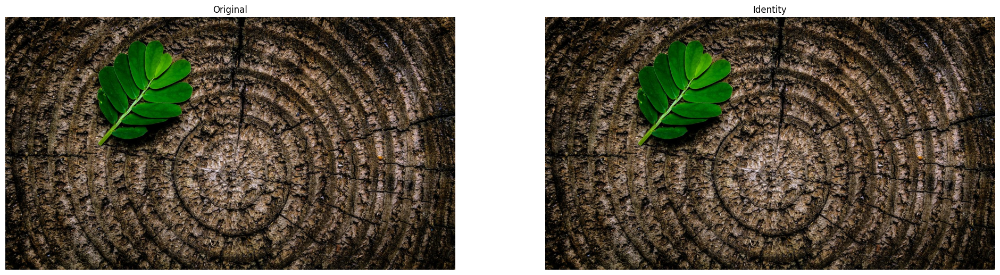

In [48]:
if image is not None:
    kernel_identity = np.array([[0, 0, 0],
                                [0, 1, 0],
                                [0, 0, 0]])

    identity_img = cv2.filter2D(src=image, ddepth=-1, kernel=kernel_identity)

    learn_tools.show_two_images('Original', image, 'Identity', identity_img)
    # cv2.imwrite('identity.jpg', identity_img)

What `ddepth` actually means?

`ddepth` = destination depth

It defines the data type of the output image, not the kernel.

Examples of depths:
- `cv2.CV_8U` → `uint8`
- `cv2.CV_16S` → `int16`
- `cv2.CV_32F` → `float32`
- `cv2.CV_64F` → `float64`

`ddepth` Use cases:
- `cv2.CV_32F` → Make it float
- `cv2.CV_16S` → Use signed 16-bit
- `-1` → Don’t decide. Just reuse the input type.

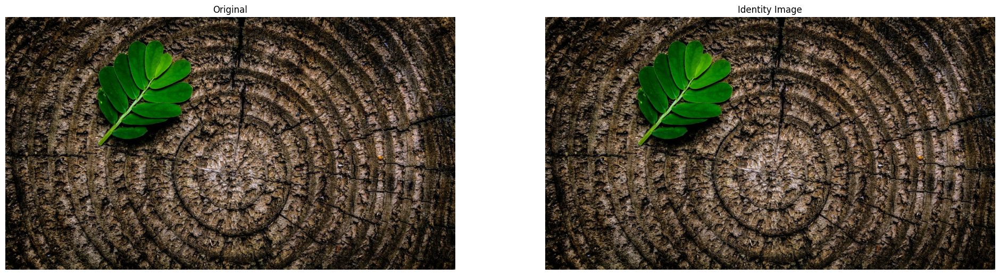

In [49]:
if image is not None:
    # Step 1: Define the identity kernel
    kernel_identity = np.array(
        [
            [0, 0, 0],
            [0, 1, 0],
            [0, 0, 0]
        ]
    )

    # Step 2: Apply convolution using the identity kernel
    identity_img = cv2.filter2D(src=image, ddepth=-1, kernel=kernel_identity)

    # Step 3: Display the original and processed images side by side
    learn_tools.show_two_images(
        title1='Original', img1=image,
        title2='Identity Image', img2=identity_img
    )

    # Optional: Save the resulting image to disk
    # cv2.imwrite('Identity_Image.jpg', identity_img)


## 6. Low-Pass Filters: Blurring Techniques

Low-pass filters attenuate high-frequency components, resulting in a smoother image.

### 6.1 Custom Box Blur

A box blur uses a **normalized averaging kernel**:

$$
K = \frac{1}{50}
\begin{bmatrix}
1 & 1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 & 1 & 1 & 1
\end{bmatrix}
\quad (8 \times 8)
$$


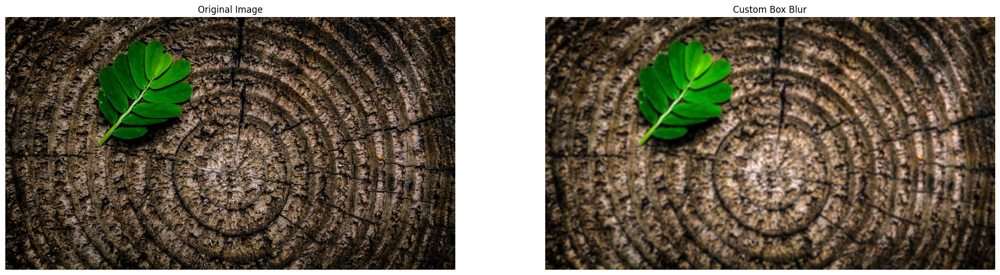

In [50]:
if image is not None:
    # Step 1: Define a custom 5x5 box blur kernel
    kernel_box = np.ones((8, 8), np.float32) / 50

    # Step 2: Apply convolution with the box blur kernel
    box_blur_custom = cv2.filter2D(src=image, ddepth=-1, kernel=kernel_box)

    # Step 3: Display the original and blurred images side by side
    learn_tools.show_two_images(
        title1='Original Image', img1=image,
        title2='Custom Box Blur', img2=box_blur_custom
    )

    # Step 4: Save the blurred image to disk
    # cv2.imwrite('custom_box_blur_image.jpg', box_blur_custom)


### 6.2 Built-in Box Blur

OpenCV's `cv2.blur()` is optimized for box filtering.

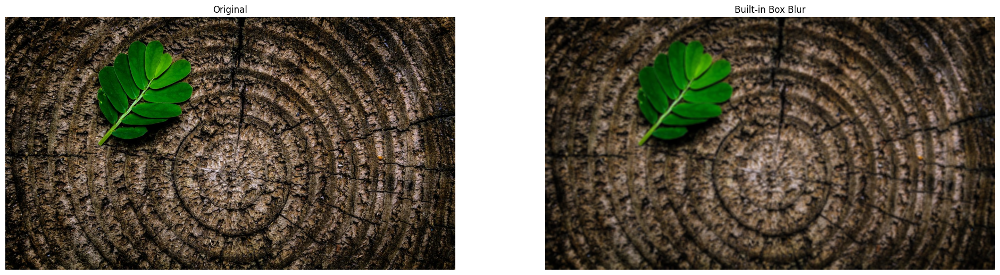

In [53]:
if image is not None:
    # Step 1: Apply OpenCV's built-in box blur function
    box_blur_builtin = cv2.blur(src=image, ksize=(8, 8))

    # Step 2: Display the original and blurred images side by side
    learn_tools.show_two_images(
        'Original', image,
        'Built-in Box Blur', box_blur_builtin
    )

    # Optional: Save the resulting image
    # cv2.imwrite('box_blur_builtin.jpg', box_blur_builtin)


### 6.3 Gaussian Blur

Gaussian blur uses a kernel based on the **Gaussian (normal) distribution**.  
It smooths the image while preserving edges better than a simple box blur.

- **Sigma (σ)** controls the **spread of the Gaussian**:  
  - Larger σ → more blur  
  - Smaller σ → less blur

The 2D Gaussian function is defined as:

$$
G(x, y) = \frac{1}{2 \pi \sigma^2} \, e^{-\frac{x^2 + y^2}{2 \sigma^2}}
$$

- Here, \(x\) and \(y\) are the distances from the kernel center.  
- The kernel weights decrease with distance from the center, giving a **weighted average** that emphasizes nearby pixels.

**Key Notes:**
1. Gaussian blur is a **low-pass filter**, reducing high-frequency noise.  
2. Unlike a box blur, it gives **smoother, visually pleasing results** because edges are less harshly averaged.  
3. In OpenCV, you can apply it using `cv2.GaussianBlur(image, ksize, sigmaX)`.

In [ ]:
if image is not None:
    # Step 1: Apply Gaussian blur
    gaussian_blur = cv2.GaussianBlur(src=image, ksize=(5, 5), sigmaX=0)

    # Step 2: Display the original and blurred images side by side
    learn_tools.show_two_images(
        'Original', image,
        'Gaussian Blur', gaussian_blur
    )

    # Optional: Save the blurred image to disk
    # cv2.imwrite('gaussian_blur.jpg', gaussian_blur)


### 6.4 Median Blur

Non-linear filter; replaces pixel with median of neighborhood. Great for salt-and-pepper noise.

In [ ]:
if image is not None:
    median_blur = cv2.medianBlur(src=image, ksize=5)

    learn_tools.show_two_images('Original', image, 'Median Blur', median_blur)
    # cv2.imwrite('median_blur.jpg', median_blur)

### 6.5 Bilateral Filter

Edge-preserving smoothing. Considers intensity and spatial differences.

In [ ]:
if image is not None:
    bilateral = cv2.bilateralFilter(src=image, d=9, sigmaColor=75, sigmaSpace=75)

    learn_tools.show_two_images('Original', image, 'Bilateral Filter', bilateral)
    # cv2.imwrite('bilateral.jpg', bilateral)

## 7. High-Pass Filters: Sharpening and Edge Enhancement

High-pass filters emphasize edges by subtracting low-pass from original.

### 7.1 Basic Sharpening Kernel

\[ K = \begin{bmatrix} 0 & -1 & 0 \\ -1 & 5 & -1 \\ 0 & -1 & 0 \end{bmatrix} \]

In [ ]:
if image is not None:
    kernel_sharpen = np.array([[0, -1, 0],
                               [-1, 5, -1],
                               [0, -1, 0]])
    sharpened = cv2.filter2D(src=image, ddepth=-1, kernel=kernel_sharpen)

    learn_tools.show_two_images('Original', image, 'Sharpened', sharpened)
    # cv2.imwrite('sharpened.jpg', sharpened)

### 7.2 Unsharp Masking

Sharpen by adding high-pass (original - blurred) scaled by factor.

In [ ]:
if image is not None:
    blurred = cv2.GaussianBlur(image, (0, 0), sigmaX=3)
    unsharp_mask = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)

    learn_tools.show_two_images('Original', image, 'Unsharp Mask', unsharp_mask)
    # cv2.imwrite('unsharp_mask.jpg', unsharp_mask)

### 7.3 Laplacian Filter for Edge Detection

Second derivative; highlights regions of rapid intensity change.

\[ K = \begin{bmatrix} 0 & 1 & 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0 \end{bmatrix} \]

In [ ]:
if gray_image is not None:
    laplacian = cv2.Laplacian(gray_image, ddepth=cv2.CV_64F, ksize=3)
    laplacian_abs = cv2.convertScaleAbs(laplacian)

    learn_tools.show_two_images('Grayscale Original', gray_image, 'Laplacian', laplacian_abs)
    # cv2.imwrite('laplacian.jpg', laplacian_abs)

### 7.4 Sobel Operators

First derivative for horizontal/vertical edges.

Horizontal: \[ K_x = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix} \]
Vertical: \[ K_y = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix} \]

In [ ]:
if gray_image is not None:
    sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, dx=1, dy=0, ksize=3)
    sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, dx=0, dy=1, ksize=3)
    sobel_combined = cv2.magnitude(sobel_x, sobel_y)
    sobel_combined_abs = cv2.convertScaleAbs(sobel_combined)

    learn_tools.show_two_images('Grayscale Original', gray_image, 'Sobel Edges', sobel_combined_abs)
    # cv2.imwrite('sobel.jpg', sobel_combined_abs)

## 8. Directional and Advanced Kernels

### 8.1 Emboss Filter

Creates 3D-like effect by directional lighting simulation.

\[ K = \begin{bmatrix} -2 & -1 & 0 \\ -1 & 1 & 1 \\ 0 & 1 & 2 \end{bmatrix} \]

In [ ]:
if image is not None:
    kernel_emboss = np.array([[-2, -1, 0],
                              [-1, 1, 1],
                              [0, 1, 2]])
    emboss = cv2.filter2D(src=image, ddepth=-1, kernel=kernel_emboss)

    learn_tools.show_two_images('Original', image, 'Emboss', emboss)
    # cv2.imwrite('emboss.jpg', emboss)

### 8.2 Prewitt Operator

Similar to Sobel but without weighting.

Horizontal: \[ K_x = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix} \]

In [ ]:
if gray_image is not None:
    kernel_prewitt_x = np.array([[-1, 0, 1],
                                 [-1, 0, 1],
                                 [-1, 0, 1]])
    prewitt_x = cv2.filter2D(gray_image, -1, kernel_prewitt_x)

    learn_tools.show_two_images('Grayscale Original', gray_image, 'Prewitt X', prewitt_x)
    # cv2.imwrite('prewitt.jpg', prewitt_x)

### 8.3 Scharr Operator

Optimized Sobel for better rotation invariance.

In [ ]:
if gray_image is not None:
    scharr_x = cv2.Scharr(gray_image, cv2.CV_64F, dx=1, dy=0)
    scharr_abs = cv2.convertScaleAbs(scharr_x)

    learn_tools.show_two_images('Grayscale Original', gray_image, 'Scharr X', scharr_abs)
    # cv2.imwrite('scharr.jpg', scharr_abs)

### 8.4 Gabor Filters

Frequency and orientation selective; useful for texture analysis.

In [ ]:
if gray_image is not None:
    gabor_kernel = cv2.getGaborKernel(ksize=(31, 31), sigma=4.0, theta=np.pi/4, lambd=10.0, gamma=0.5, psi=0)
    gabor_filtered = cv2.filter2D(gray_image, cv2.CV_8UC3, gabor_kernel)

    learn_tools.show_two_images('Grayscale Original', gray_image, 'Gabor Filter', gabor_filtered)
    # cv2.imwrite('gabor.jpg', gabor_filtered)

## 9. Frequency Domain Filtering

Convolution in spatial domain = multiplication in frequency domain.

### 9.1 Fourier Transform Basics

Use DFT to transform image to frequency domain.

In [ ]:
if gray_image is not None:
    dft = cv2.dft(np.float32(gray_image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))

    plt.figure(figsize=(10, 5))
    plt.subplot(121), plt.imshow(gray_image, cmap='gray'), plt.title('Input Image')
    plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray'), plt.title('Magnitude Spectrum')
    plt.show()

### 9.2 High-Pass and Low-Pass in Frequency Domain

Example: Ideal low-pass filter masks high frequencies.

In [ ]:
if gray_image is not None:
    rows, cols = gray_image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.uint8)
    mask[crow-30:crow+30, ccol-30:ccol+30] = 1

    fshift = dft_shift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

    learn_tools.show_two_images('Original Grayscale', gray_image, 'Low-Pass Filtered', img_back)
    # cv2.imwrite('freq_lowpass.jpg', img_back)

## 10. Noise in Images: Addition and Removal

Demonstrate adding Gaussian noise and removing with filters.

In [ ]:
if image is not None:
    mean = 0
    var = 10
    sigma = var ** 0.5
    gaussian_noise = np.random.normal(mean, sigma, image.shape)
    noisy_image = np.clip(image + gaussian_noise, 0, 255).astype(np.uint8)

    denoised_gaussian = cv2.GaussianBlur(noisy_image, (5, 5), 0)
    denoised_median = cv2.medianBlur(noisy_image, 5)

    # Show three images: Original, Noisy, Denoised Gaussian
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)); axes[0].set_title('Original')
    axes[1].imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB)); axes[1].set_title('Noisy')
    axes[2].imshow(cv2.cvtColor(denoised_gaussian, cv2.COLOR_BGR2RGB)); axes[2].set_title('Denoised Gaussian')
    axes[3].imshow(cv2.cvtColor(denoised_median, cv2.COLOR_BGR2RGB)); axes[3].set_title('Denoised Median')
    plt.show()
    # cv2.imwrite('noisy.jpg', noisy_image)
    # cv2.imwrite('denoised_gaussian.jpg', denoised_gaussian)

## 11. Performance Considerations and Optimization

- Use separable filters for speed (e.g., Gaussian).
- Integral images for box filters.
- GPU acceleration with OpenCV CUDA.
- Benchmark: Larger kernels slower; use built-in functions.

In [ ]:
import time
if image is not None:
    start = time.time()
    cv2.filter2D(image, -1, np.ones((15,15), np.float32)/225)
    custom_time = time.time() - start

    start = time.time()
    cv2.blur(image, (15,15))
    builtin_time = time.time() - start

    print(f'Custom Filter Time: {custom_time:.4f}s')
    print(f'Built-in Blur Time: {builtin_time:.4f}s')